In [1]:
import torch
from torch import nn
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

import seaborn as sns
import os
import pandas as pd
from collections import Counter
%matplotlib inline


In [2]:
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [3]:
image_path = "/kaggle/input/pizza-steak-sushi/"
train_dir = os.path.join(image_path, "train")
test_dir = os.path.join(image_path, "test")

print(train_dir, test_dir)

/kaggle/input/pizza-steak-sushi/train /kaggle/input/pizza-steak-sushi/test


# visualize images from train data

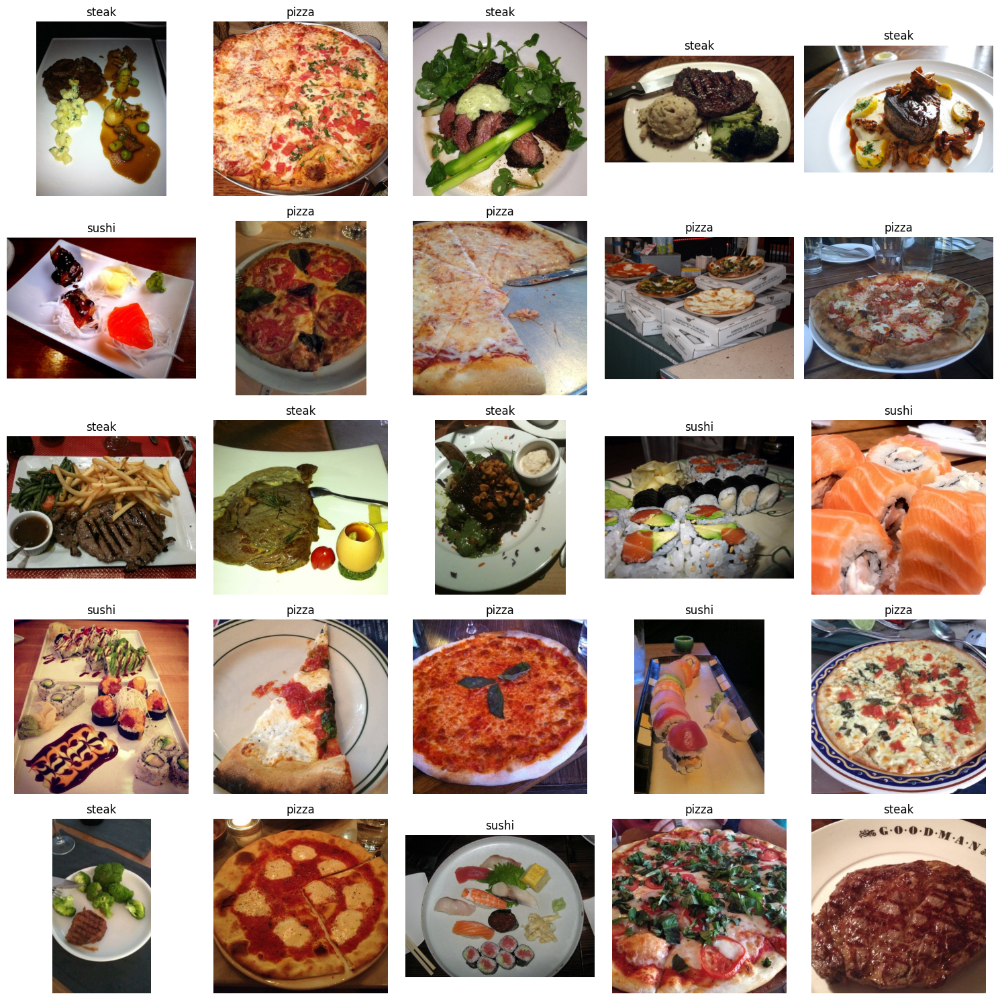

In [4]:
classes = os.listdir(train_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(train_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

# visualize Images from test data

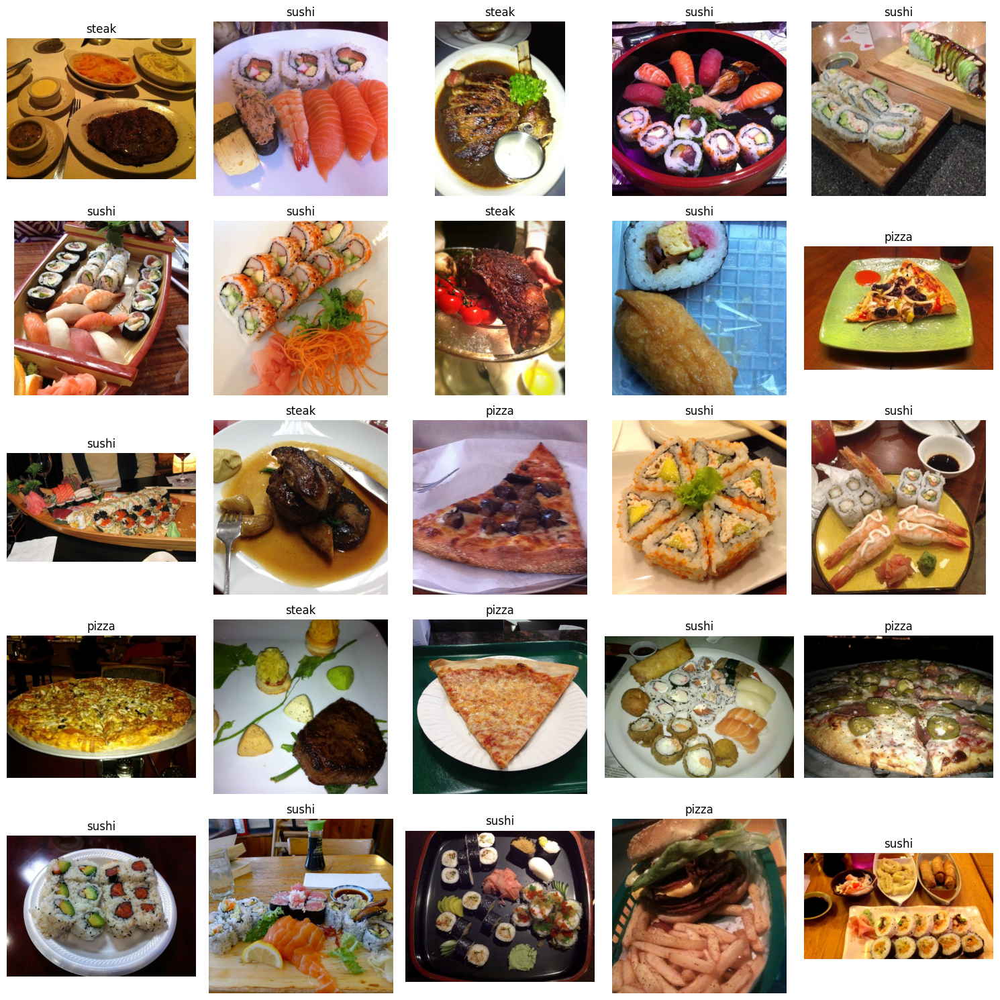

In [5]:
classes = os.listdir(test_dir)
image_paths = []
labels = []

for label in classes:
    class_dir = os.path.join(test_dir, label)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

sample_indices = random.sample(range(len(image_paths)), 25)
sample_images = [image_paths[i] for i in sample_indices]
sample_labels = [labels[i] for i in sample_indices]

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax, label in zip(sample_images, axes, sample_labels):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

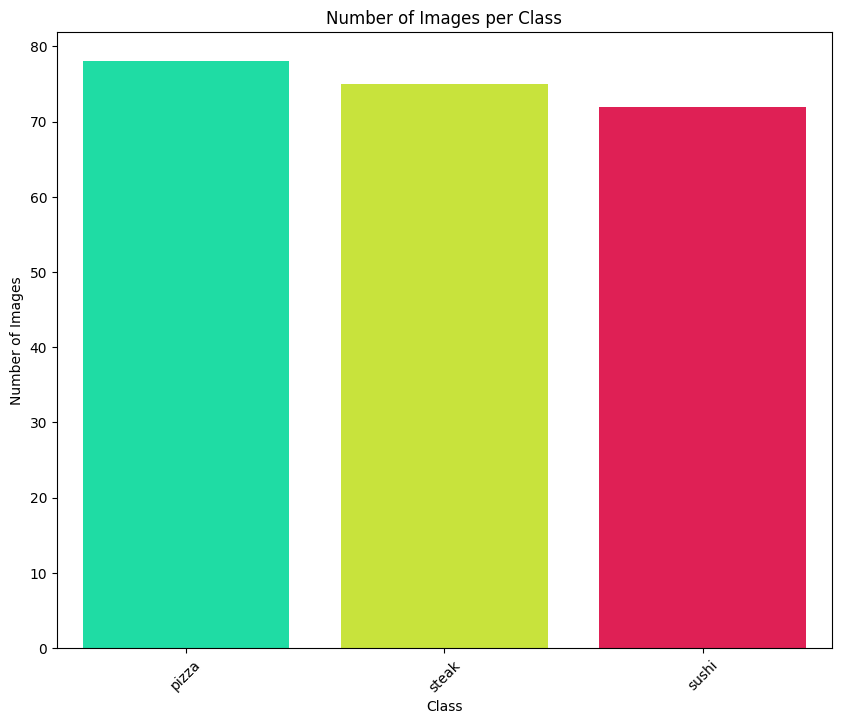

In [6]:
new_path="/kaggle/input/pizza-steak-sushi/train/"
class_names = ['pizza', 'steak', 'sushi']  
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
sns.barplot(data=df, x='Class', y='Count', palette='gist_ncar')
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()


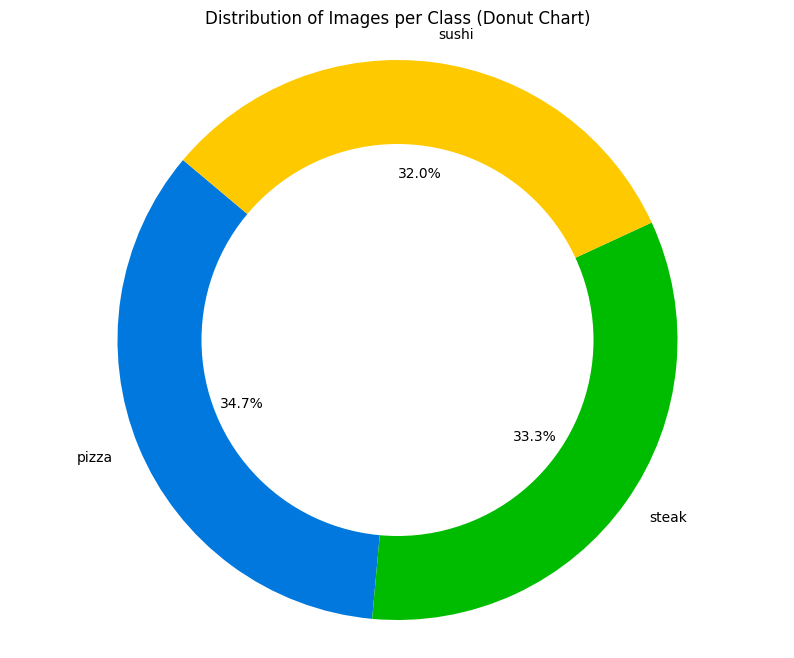

In [7]:
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
plt.pie(df['Count'], labels=df['Class'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("nipy_spectral", len(class_names)))
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Images per Class (Donut Chart)')
plt.show()

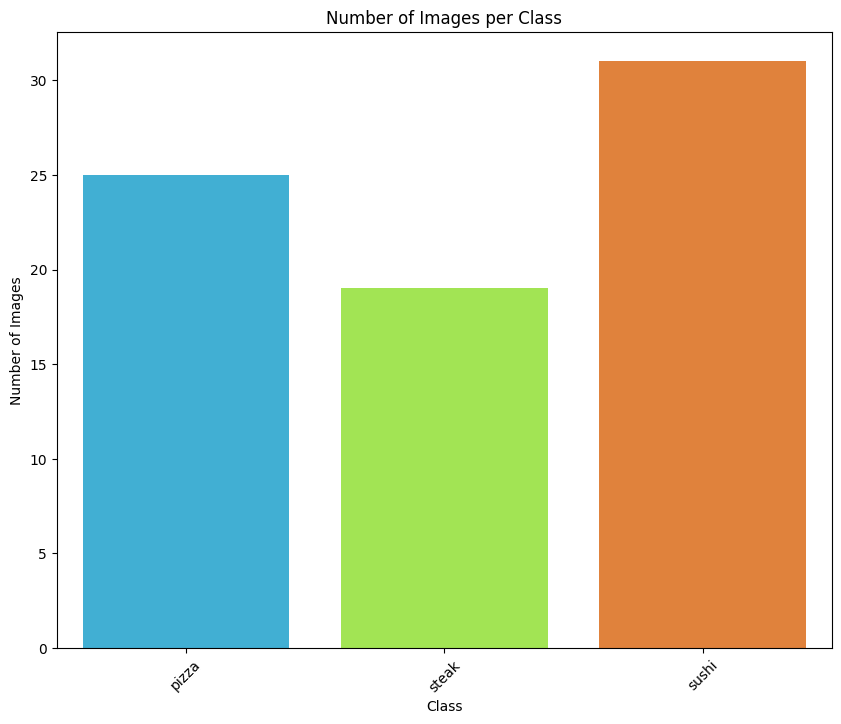

In [8]:
test_path="/kaggle/input/pizza-steak-sushi/test/"
class_names = ['pizza', 'steak', 'sushi']  
data = {}
for class_name in class_names:
    class_dir = os.path.join(test_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
sns.barplot(data=df, x='Class', y='Count', palette='turbo')
plt.title('Number of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

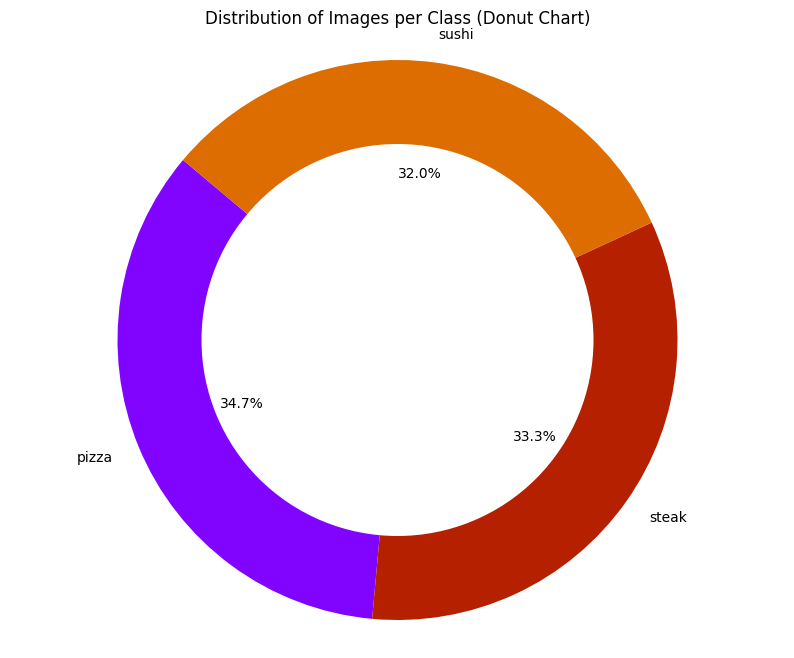

In [9]:
data = {}
for class_name in class_names:
    class_dir = os.path.join(new_path, class_name)
    data[class_name] = len(os.listdir(class_dir))

df = pd.DataFrame(list(data.items()), columns=['Class', 'Count'])

plt.figure(figsize=(10,8))
plt.pie(df['Count'], labels=df['Class'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("gnuplot", len(class_names)))
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Images per Class (Donut Chart)')
plt.show()

In [10]:
from pathlib import Path


image_path = Path("/kaggle/input/pizza-steak-sushi/")

# Get list of image paths
image_path_list = list(image_path.glob("*/*/*.jpg"))

# transform Images

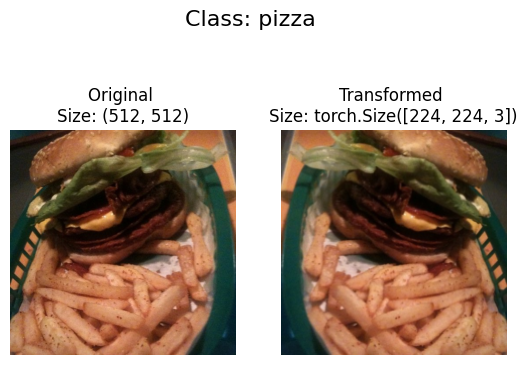

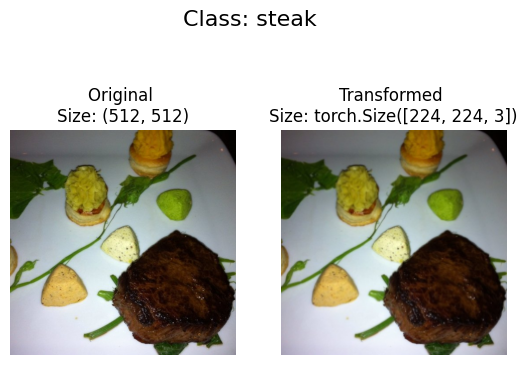

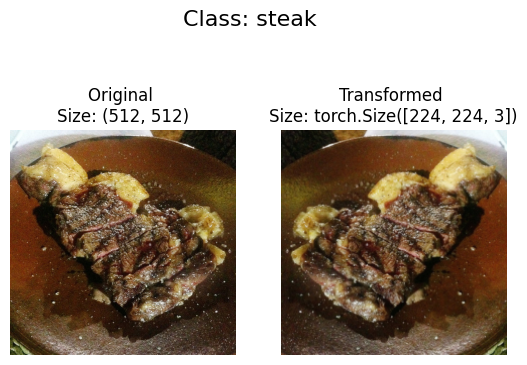

In [11]:
data_transform=transforms.Compose([transforms.Resize(size=(224,224)),transforms.RandomHorizontalFlip(p=0.5),
                                 transforms.ToTensor()])
def plot_transformed_images(image_paths, transform, n=3, seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_path_list, transform=data_transform, n=3)

# Use ImageFolder to create dataset(s)

In [12]:
train_data = datasets.ImageFolder(root=train_dir, transform=data_transform, target_transform=None)
test_data = datasets.ImageFolder(root=test_dir, transform=data_transform)

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 225
    Root location: /kaggle/input/pizza-steak-sushi/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 75
    Root location: /kaggle/input/pizza-steak-sushi/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )


In [13]:
class_names = train_data.classes
class_names

['pizza', 'steak', 'sushi']

In [14]:
class_dict = train_data.class_to_idx
class_dict

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [15]:
img, label = train_data[0][0], train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape: {img.shape}")
print(f"Image datatype: {img.dtype}")
print(f"Image label: {label}")
print(f"Label datatype: {type(label)}")

Image tensor:
tensor([[[0.1137, 0.1176, 0.1255,  ..., 0.1098, 0.1098, 0.1098],
         [0.1176, 0.1137, 0.1137,  ..., 0.1176, 0.1176, 0.1137],
         [0.1137, 0.1176, 0.1098,  ..., 0.1216, 0.1255, 0.1216],
         ...,
         [0.0941, 0.0902, 0.0863,  ..., 0.1725, 0.1725, 0.1804],
         [0.0902, 0.0902, 0.0902,  ..., 0.1647, 0.1686, 0.1686],
         [0.0863, 0.0863, 0.0824,  ..., 0.1490, 0.1529, 0.1529]],

        [[0.0706, 0.0745, 0.0824,  ..., 0.0549, 0.0549, 0.0549],
         [0.0745, 0.0706, 0.0706,  ..., 0.0627, 0.0627, 0.0588],
         [0.0706, 0.0784, 0.0667,  ..., 0.0627, 0.0667, 0.0627],
         ...,
         [0.1098, 0.1059, 0.1020,  ..., 0.2353, 0.2314, 0.2314],
         [0.1059, 0.1059, 0.1059,  ..., 0.2275, 0.2314, 0.2314],
         [0.1020, 0.1020, 0.0980,  ..., 0.2196, 0.2235, 0.2235]],

        [[0.0941, 0.0980, 0.1059,  ..., 0.0196, 0.0196, 0.0196],
         [0.0980, 0.0941, 0.0941,  ..., 0.0235, 0.0235, 0.0196],
         [0.0941, 0.0980, 0.0902,  ..., 0.02

# Turn train and test Datasets into DataLoaders

In [16]:
train_dataloader = DataLoader(dataset=train_data, 
                              batch_size=8, # how many samples per batch?
                              num_workers=1, # how many subprocesses to use for data loading? (higher = more)
                              shuffle=True) # shuffle the data?

test_dataloader = DataLoader(dataset=test_data, 
                             batch_size=8, 
                             num_workers=1, 
                             shuffle=False) # don't usually need to shuffle testing data

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x791d219e4ca0>,
 <torch.utils.data.dataloader.DataLoader at 0x791d219e4220>)

In [17]:
import torchvision

weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights=weights).to(device)
for param in model.features.parameters():
    param.requires_grad = False
    


In [18]:
model.classifier = torch.nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280, 
              out_features=len(class_names),
              bias=True).to(device))
from torchinfo import summary
summary(model, input_size=(1,3, 224, 224))


Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [1, 3]                    --
├─Sequential: 1-1                                       [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                        [1, 32, 112, 112]         --
│    │    └─Conv2d: 3-1                                 [1, 32, 112, 112]         (864)
│    │    └─BatchNorm2d: 3-2                            [1, 32, 112, 112]         (64)
│    │    └─SiLU: 3-3                                   [1, 32, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 16, 112, 112]         --
│    │    └─MBConv: 3-4                                 [1, 16, 112, 112]         (1,448)
│    └─Sequential: 2-3                                  [1, 24, 56, 56]           --
│    │    └─MBConv: 3-5                                 [1, 24, 56, 56]           (6,004)
│    │    └─MBConv: 3-6                      

In [19]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Create train & test loop functions

In [20]:
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               loss_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()
    
    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0
    
    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item() 

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metrics across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch 
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

In [21]:
def test_step(model: torch.nn.Module, 
              dataloader: torch.utils.data.DataLoader, 
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval() 
    
    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0
    
    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)
    
            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()
            
            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))
            
    # Adjust metrics to get average loss and accuracy per batch 
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

In [22]:
from tqdm.auto import tqdm

# 1. Take in various parameters required for training and test steps
def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):
    
    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }
    
    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn)
        
        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        # Ensure all data is moved to CPU and converted to float for storage
        results["train_loss"].append(train_loss.item() if isinstance(train_loss, torch.Tensor) else train_loss)
        results["train_acc"].append(train_acc.item() if isinstance(train_acc, torch.Tensor) else train_acc)
        results["test_loss"].append(test_loss.item() if isinstance(test_loss, torch.Tensor) else test_loss)
        results["test_acc"].append(test_acc.item() if isinstance(test_acc, torch.Tensor) else test_acc)

    # 6. Return the filled results at the end of the epochs
    return results

In [23]:
# Set random seeds
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 20





# Start the timer
from timeit import default_timer as timer 
start_time = timer()

# Train model_0 
results = train(model=model, 
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn, 
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9770 | train_acc: 0.4871 | test_loss: 0.7871 | test_acc: 0.7917
Epoch: 2 | train_loss: 0.6938 | train_acc: 0.7759 | test_loss: 0.5966 | test_acc: 0.8250
Epoch: 3 | train_loss: 0.6136 | train_acc: 0.8017 | test_loss: 0.5025 | test_acc: 0.8625
Epoch: 4 | train_loss: 0.5121 | train_acc: 0.8405 | test_loss: 0.4106 | test_acc: 0.9000
Epoch: 5 | train_loss: 0.4810 | train_acc: 0.8362 | test_loss: 0.4209 | test_acc: 0.9250
Epoch: 6 | train_loss: 0.4581 | train_acc: 0.8017 | test_loss: 0.3378 | test_acc: 0.9250
Epoch: 7 | train_loss: 0.3913 | train_acc: 0.8491 | test_loss: 0.3473 | test_acc: 0.9000
Epoch: 8 | train_loss: 0.3336 | train_acc: 0.9310 | test_loss: 0.3206 | test_acc: 0.9000
Epoch: 9 | train_loss: 0.3837 | train_acc: 0.8664 | test_loss: 0.3227 | test_acc: 0.9625
Epoch: 10 | train_loss: 0.3991 | train_acc: 0.8534 | test_loss: 0.3398 | test_acc: 0.9125
Epoch: 11 | train_loss: 0.3561 | train_acc: 0.8922 | test_loss: 0.3163 | test_acc: 0.9500
Epoch: 12 | train_l

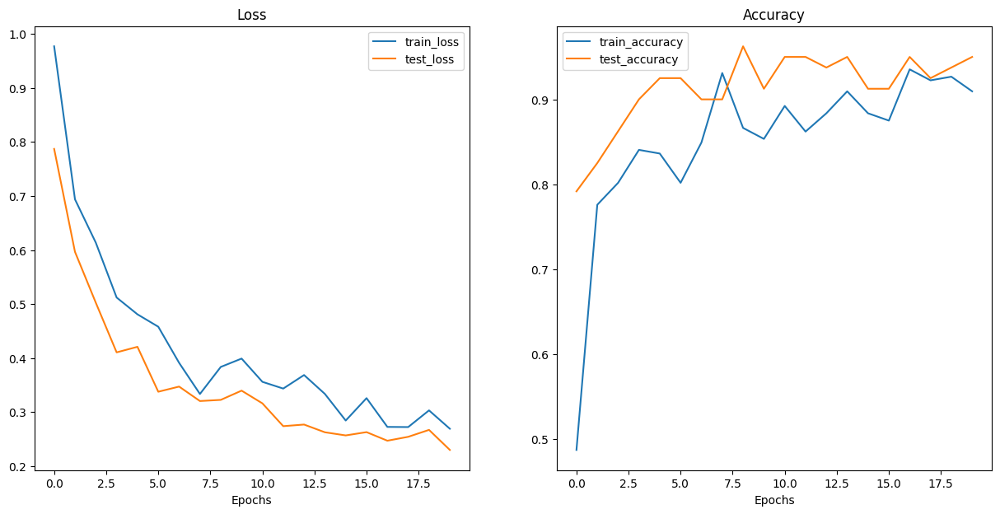

In [24]:
from typing import Dict, List
def plot_loss_curves(results: Dict[str, List[float]]):
    loss = results['train_loss']
    test_loss = results['test_loss']
    accuracy = results['train_acc']
    test_accuracy = results['test_acc']
    epochs = range(len(results['train_loss']))
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, test_accuracy, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
plot_loss_curves(results)


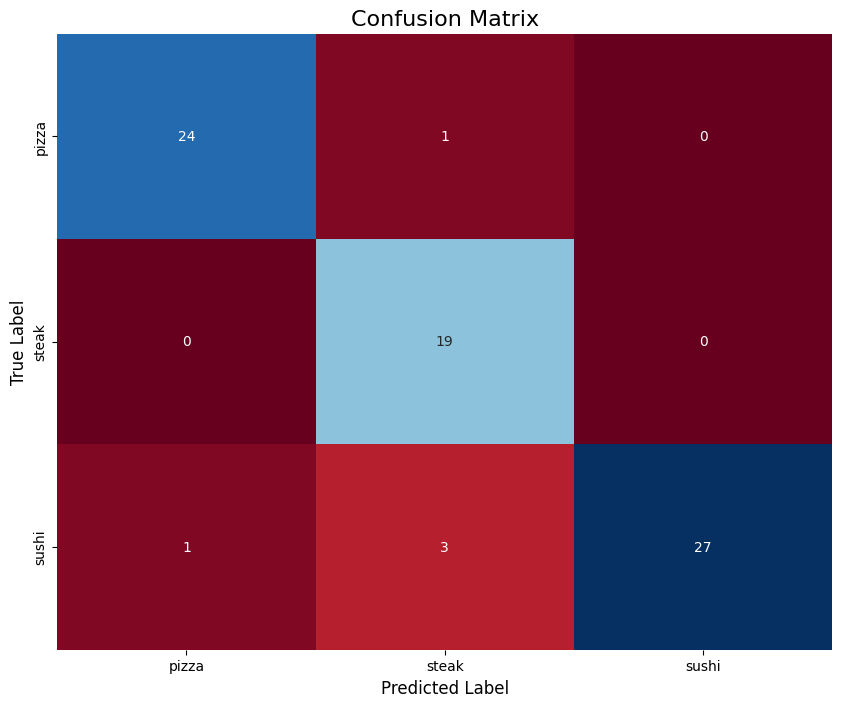

In [25]:
from sklearn.metrics import confusion_matrix
model.eval()

all_labels = []
all_preds = []
all_outputs = []
# Turn on inference mode
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        outputs = model(X)
        all_outputs.append(outputs.cpu().numpy())
        _, preds = torch.max(outputs, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from train data

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='RdBu', xticklabels=class_names, yticklabels=class_names, cbar=False)

# Add titles and labels
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

# Display the plot
plt.show()

# Classification Report

In [26]:
from sklearn.metrics import classification_report
print(classification_report(all_labels,all_preds, target_names=class_names))

              precision    recall  f1-score   support

       pizza       0.96      0.96      0.96        25
       steak       0.83      1.00      0.90        19
       sushi       1.00      0.87      0.93        31

    accuracy                           0.93        75
   macro avg       0.93      0.94      0.93        75
weighted avg       0.94      0.93      0.93        75



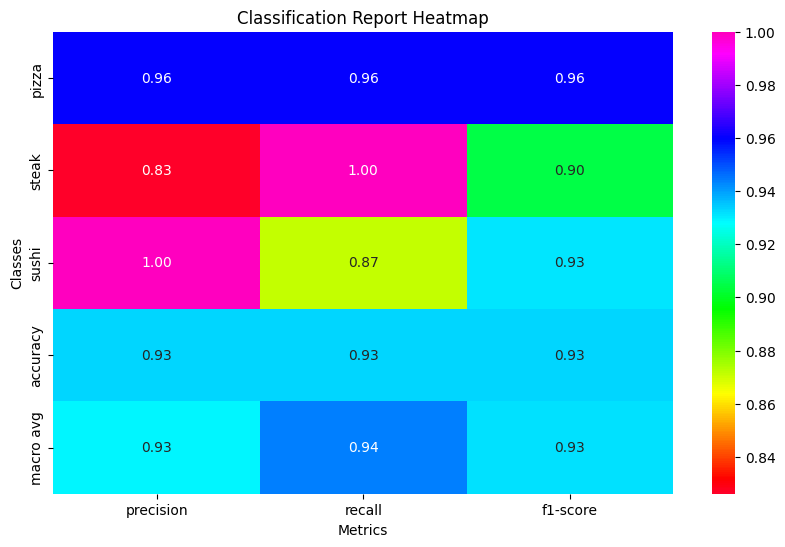

In [27]:
report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plotting the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, fmt=".2f", cmap="gist_rainbow")
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.show()

In [28]:
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights)
summary(model=effnetb2, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
       
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
) 

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [29]:
print(f"Number of in_features to final layer of EfficientNetB2: {len(effnetb2.classifier.state_dict()['1.weight'][0])}")

Number of in_features to final layer of EfficientNetB2: 1408


In [30]:
# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

In [31]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

In [32]:
effnetb0 = create_effnetb0() 


summary(model=effnetb0, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
) 

[INFO] Created new effnetb0 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [33]:
effnetb2 = create_effnetb2()

# Get an output summary of the layers in our EffNetB2 feature extractor model (uncomment to view full output)
summary(model=effnetb2, 
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
) 

[INFO] Created new effnetb2 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [34]:
def train_models(models: list, train_dataloader: torch.utils.data.DataLoader, 
                 test_dataloader: torch.utils.data.DataLoader, 
                 optimizers: list, loss_fn: nn.Module = nn.CrossEntropyLoss(), 
                 epochs: int = 5, save_path: str = "best_model.pth"):
    
    # Create empty results dictionary for each model
    results = {model.name: {"train_loss": [], "train_acc": [], "test_loss": [], "test_acc": []} for model in models}
    best_acc = 0  # Track best accuracy
    best_model_name = None

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        for i, model in enumerate(models):
            optimizer = optimizers[i]
            model_name = model.name
            
            train_loss, train_acc = train_step(model=model, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer)
            test_loss, test_acc = test_step(model=model, dataloader=test_dataloader, loss_fn=loss_fn)
            
            # Print out what's happening
            print(f"Epoch {epoch+1} - {model_name}: "
                  f"train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | "
                  f"test_loss: {test_loss:.4f} | test_acc: {test_acc:.4f}")
            
            # Update results dictionary
            results[model_name]["train_loss"].append(train_loss)
            results[model_name]["train_acc"].append(train_acc)
            results[model_name]["test_loss"].append(test_loss)
            results[model_name]["test_acc"].append(test_acc)
            
            # Save the model if it has the best accuracy
            if test_acc > best_acc:
                best_acc = test_acc
                best_model_name = model_name
                torch.save(model.state_dict(), save_path)
                print(f"[INFO] New best model found: {model_name}, saved to {save_path}")
    
    print(f"Training complete. Best model: {best_model_name} with accuracy {best_acc:.4f}")
    return results


In [35]:
# Create models
effnetb0 = create_effnetb0() 
effnetb2 = create_effnetb2()

# Define optimizers for both models
optimizer_b0 = torch.optim.Adam(effnetb0.parameters(), lr=1e-4)
optimizer_b2 = torch.optim.Adam(effnetb2.parameters(), lr=1e-4)

# List of models and optimizers
models = [effnetb0, effnetb2]
optimizers = [optimizer_b0, optimizer_b2]

# Set random seed for reproducibility
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 10

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Train both models and save the best one
results = train_models(models=models, 
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizers=optimizers,
                       loss_fn=loss_fn, 
                       epochs=NUM_EPOCHS,
                       save_path="best_effnet_model.pth")

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")


[INFO] Created new effnetb0 model.
[INFO] Created new effnetb2 model.


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1 - effnetb0: train_loss: 1.1096 | train_acc: 0.3405 | test_loss: 1.0601 | test_acc: 0.4208
[INFO] New best model found: effnetb0, saved to best_effnet_model.pth
Epoch 1 - effnetb2: train_loss: 1.1105 | train_acc: 0.3233 | test_loss: 1.0727 | test_acc: 0.3375
Epoch 2 - effnetb0: train_loss: 1.0660 | train_acc: 0.4397 | test_loss: 1.0092 | test_acc: 0.5917
[INFO] New best model found: effnetb0, saved to best_effnet_model.pth
Epoch 2 - effnetb2: train_loss: 1.0695 | train_acc: 0.4310 | test_loss: 1.0523 | test_acc: 0.4000
Epoch 3 - effnetb0: train_loss: 1.0192 | train_acc: 0.5603 | test_loss: 0.9976 | test_acc: 0.5792
Epoch 3 - effnetb2: train_loss: 1.0259 | train_acc: 0.5388 | test_loss: 1.0184 | test_acc: 0.5833
Epoch 4 - effnetb0: train_loss: 0.9750 | train_acc: 0.6034 | test_loss: 0.9594 | test_acc: 0.7042
[INFO] New best model found: effnetb0, saved to best_effnet_model.pth
Epoch 4 - effnetb2: train_loss: 0.9985 | train_acc: 0.5388 | test_loss: 0.9968 | test_acc: 0.6208
Epoch 

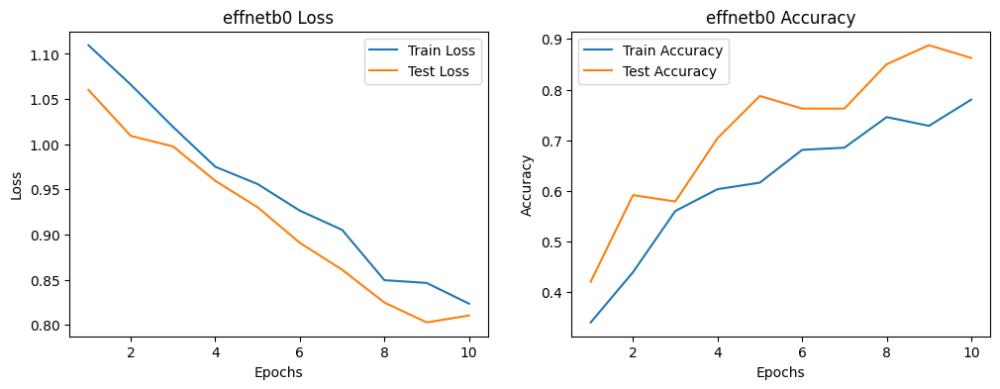

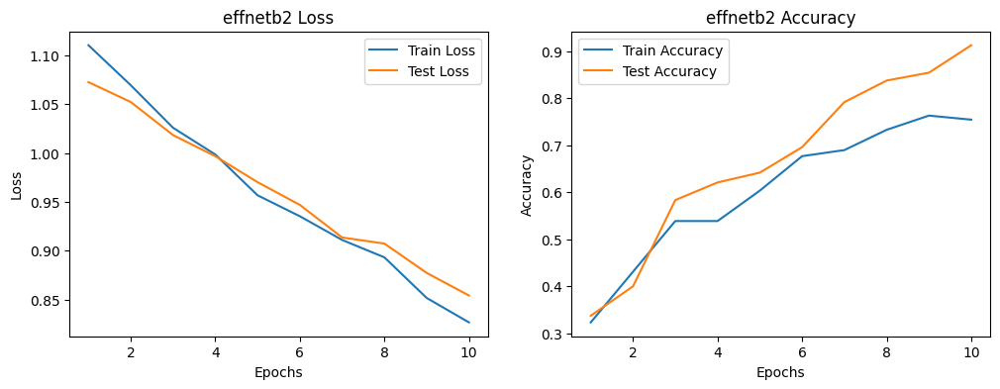

In [36]:
# Import the required libraries for plotting
import matplotlib.pyplot as plt

# Function to plot the results
def plot_results(results):
    epochs = len(results[list(results.keys())[0]]['train_loss'])  # Number of epochs

    for model_name in results.keys():
        # Plot train and test loss
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, epochs+1), results[model_name]["train_loss"], label='Train Loss')
        plt.plot(range(1, epochs+1), results[model_name]["test_loss"], label='Test Loss')
        plt.title(f'{model_name} Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot train and test accuracy
        plt.subplot(1, 2, 2)
        plt.plot(range(1, epochs+1), results[model_name]["train_acc"], label='Train Accuracy')
        plt.plot(range(1, epochs+1), results[model_name]["test_acc"], label='Test Accuracy')
        plt.title(f'{model_name} Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        # Show the plots
        plt.show()

# After training the models, call the plot_results function
plot_results(results)


[INFO] Created new effnetb2 model.


/tmp/ipykernel_3045/4020492067.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load("best_effnet_model.pth"))


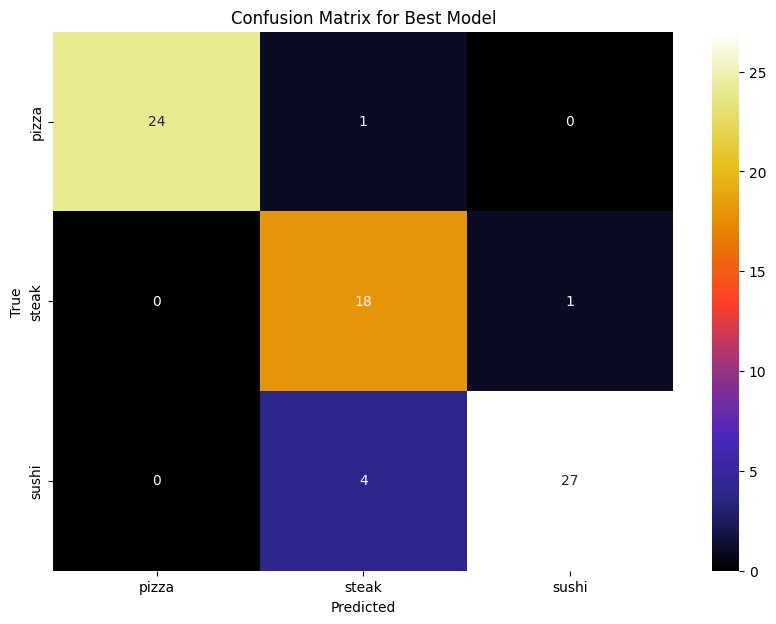

In [37]:
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(y_true, y_pred, classes, title='Confusion Matrix'):
    
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='CMRmap', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define function to get predictions
def get_predictions(model, dataloader):
    model.eval()
    model.to(device)  # Move model to the appropriate device
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)  # Move inputs and labels to the same device
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    return np.array(all_labels), np.array(all_preds)

# Load the best model
best_model = create_effnetb2() 
best_model.load_state_dict(torch.load("best_effnet_model.pth"))
best_model.to(device)  

# Get true labels and predictions
y_true, y_pred = get_predictions(best_model, test_dataloader)

# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, classes=class_names, title='Confusion Matrix for Best Model')


In [38]:
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=class_names)
print(report)

              precision    recall  f1-score   support

       pizza       1.00      0.96      0.98        25
       steak       0.78      0.95      0.86        19
       sushi       0.96      0.87      0.92        31

    accuracy                           0.92        75
   macro avg       0.92      0.93      0.92        75
weighted avg       0.93      0.92      0.92        75



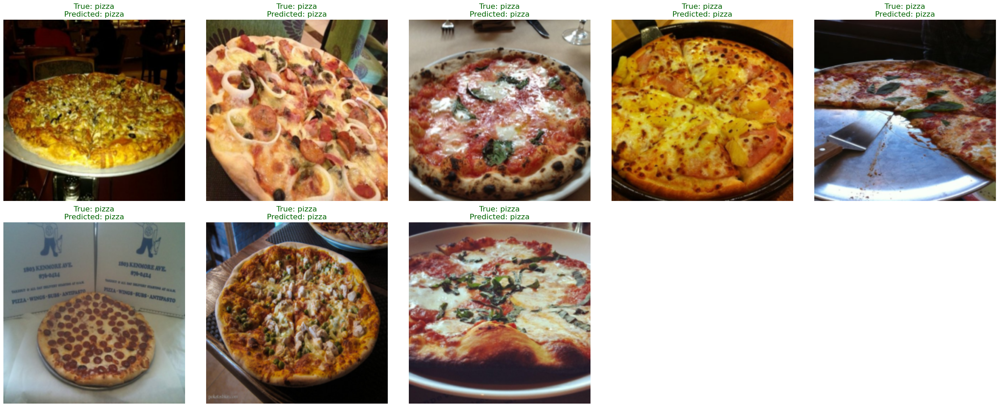

Overall accuracy: 1.00


In [39]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# Function to convert a tensor image to a NumPy array for visualization
def imshow(img):
    """Function to convert a tensor image to a NumPy array for visualization."""
    if isinstance(img, np.ndarray):
        npimg = img
    else:
        img = img / 2 + 0.5  # Unnormalize
        npimg = img.numpy()

    if npimg.shape[0] == 3:  # Check if the image has 3 channels
        return np.transpose(npimg, (1, 2, 0))  # Rearrange dimensions for matplotlib
    else:
        return npimg

# Define the classes
classes = ['pizza', 'steak', 'sushi']
class_to_idx = {'pizza': 0, 'steak': 1, 'sushi': 2}

# Set the model to evaluation mode
best_model.eval()

# Get a batch of images
dataiter = iter(test_dataloader)
images, labels = next(dataiter)

# Move images and labels to the appropriate device
images, labels = images.to(device), labels.to(device)

# Get predictions
with torch.no_grad():
    outputs = best_model(images)
    _, predicted = torch.max(outputs, 1)

# Convert to numpy for easy indexing
images = images.cpu().numpy()
labels = labels.cpu().numpy()
predicted = predicted.cpu().numpy()

# Plotting the images along with true and predicted labels
plt.figure(figsize=(30, 30))
number_images = (5, 5)
num_samples = min(number_images[0] * number_images[1], len(images))

for i in range(num_samples):
    plt.subplot(number_images[0], number_images[1], i + 1)
    plt.axis("off")
    
    true_label = classes[labels[i]]
    predicted_label = classes[predicted[i]]
    
    # Set title color based on whether prediction is correct
    color = "darkgreen" if true_label == predicted_label else "red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color, fontsize=16)
    plt.imshow(imshow(images[i]))

plt.tight_layout()
plt.show()

# Calculate overall accuracy
accuracy = (predicted == labels).mean()
print(f"Overall accuracy: {accuracy:.2f}")


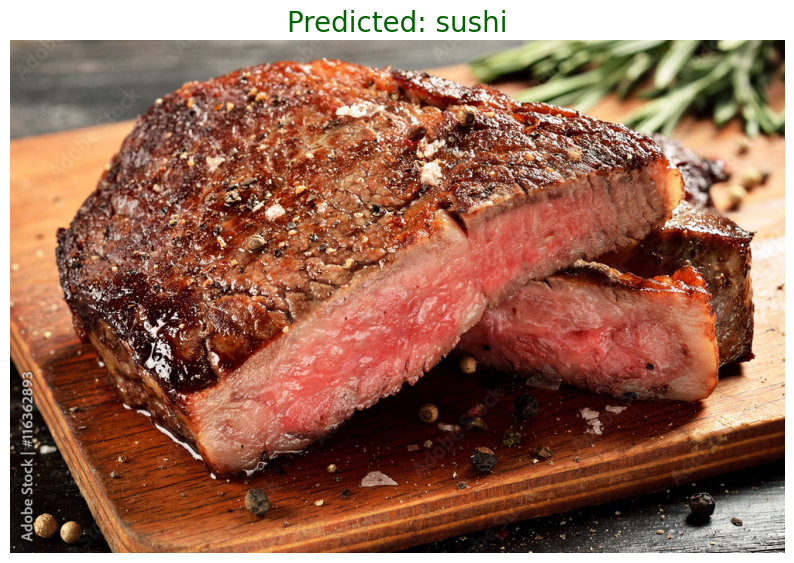

In [40]:


best_model.eval()

image_path = "/kaggle/input/custom-image-dataset/steak.jpg"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image = Image.open(image_path)
image_tensor = transform(image).unsqueeze(0)
image_tensor = image_tensor.to(device)

with torch.no_grad():
    output = best_model(image_tensor)
    _, predicted = torch.max(output, 1)
    predicted_label = classes[predicted.item()]

plt.figure(figsize=(10,8))
plt.imshow(image)
plt.axis("off")
plt.title(f"Predicted: {predicted_label}", fontsize=20, color="darkgreen")
plt.show()
